<h1><strong>Teste Técnico de Engenharia de Dados</strong></h1>

<small>Por: Ebraim Carvalho, 31/01/2022</small>
<p><a href="https://www.linkedin.com/in/ebraimcarvalho/" target="_blank">Linkedin</a></p>

A partir dos dados de corridas de Taxi de New York, o desafio consiste em buscar responder, de preferência com gráficos às seguintes questões: 

1. Qual a distância média percorrida por viagens com no máximo 2 passageiros; 
2. Quais os 3 maiores vendors em quantidade total de dinheiro arrecadado
3. Faça um histograma da distribuição mensal, nos 4 anos, de corridas pagas em dinheiro; 
4. Faça um gráfico de série temporal contando 
a quantidade de gorjetas de cada dia, nos últimos 3 meses de 2012.
5.  Qual o tempo médio das corridas nos dias de sábado e domingo?
6. Fazer uma visualização em mapa com latitude e longitude de pickups and dropoffs no ano de 2010;

A princípio, pensei em atender os requisitos básicos, usando o mínimo posssível para responder os questionamentos de forma rápida e com baixo custo, já entregando valor para a demanda. E para tal, utilizei a infraestrutura do google colab para rodar um notebook, facilitando o compartilhamento e dando agilidade para o desenvolvimento.

In [1]:
# Nesse momento, criamos as varíaveis com os caminhos para as fontes dos dados
sources_trips = [
                  'https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2009-json_corrigido.json',
                  'https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2010-json_corrigido.json',
                  'https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2011-json_corrigido.json',
                  'https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2012-json_corrigido.json'
                ]
vendor_dimension = 'https://s3.amazonaws.com/data-sprints-eng-test/data-vendor_lookup-csv.csv'
payment_lookup = 'https://s3.amazonaws.com/data-sprints-eng-test/data-payment_lookup-csv.csv'

In [2]:
# Importando bibliotecas necessárias
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sqlalchemy
import re

In [3]:
# Configurando visualização
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.rcParams['figure.figsize']=(18,9)
plt.rc('axes', titlesize=36)
sns.set_style("white")

In [4]:
def create_and_append_dataframe_from_json_file(source_filepath, target_dataframe):
  """
  Cria um dataframe de um arquivo json, faz uma cópia do dataframe destino e adiciona o novo dataframe nesta cópia, retornando-o.
  """
  dataframe_source = pd.read_json(path_or_buf = source_filepath, lines = True)
  df_return = target_dataframe.copy(deep=True)
  df_return = df_return.append(dataframe_source, ignore_index=True)
  print(f"{source_filepath} appended to target_dataframe")
  return df_return

In [5]:
# Variável para controlar os anos que já foram adicionados ao dataframe, para não ter duplicação de dados.
# Cria uma variavel para iniciar um dataframe vazio
years_to_upload = []
dataframe_fact = pd.DataFrame()

In [6]:
# Percorrer os arquivos de fonte de dados, verifica se o ano já está na variável controle (para evitar duplicação), se não estiver, adiciona o ano
# à lista e chama a função para criar e adicionar o dataframe ao dataframe principal.
for filepath in sources_trips:
  year = int(re.findall("\d{4}",filepath)[0])
  if year in years_to_upload:
    print(f"{year} already readed and dataframe was created and appended, no action to do!")
    pass
  else: 
    years_to_upload.append(year)
    dataframe_fact = create_and_append_dataframe_from_json_file(filepath, dataframe_fact)

https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2009-json_corrigido.json appended to target_dataframe
https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2010-json_corrigido.json appended to target_dataframe
https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2011-json_corrigido.json appended to target_dataframe
https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2012-json_corrigido.json appended to target_dataframe


In [7]:
# Cria dataframe para servir como dimensão Fornecedor
df_vendor_dimension = pd.read_csv(vendor_dimension)

In [8]:
df_vendor_dimension.head()

,vendor_id,name,address,city,state,zip,country,contact,current
0,CMT,"Creative Mobile Technologies, LLC",950 4th Road Suite 78,Brooklyn,NY,11210,USA,contactCMT@gmail.com,Yes
1,VTS,VeriFone Inc,26 Summit St.,Flushing,NY,11354,USA,admin@vtstaxi.com,Yes
2,DDS,"Dependable Driver Service, Inc",8554 North Homestead St.,Bronx,NY,10472,USA,9778896500,Yes
3,TS,Total Solutions Co,Five Boroughs Taxi Co.,Brooklyn,NY,11229,USA,mgmt@5btc.com,Yes
4,MT,Mega Taxi,4 East Jennings St.,Brooklyn,NY,11228,USA,contact@megataxico.com,No


In [9]:
# Cria dataframe para servir como dimensão Pagamento
df_payment_lookup = pd.read_csv(payment_lookup, header=1)

In [10]:
df_payment_lookup.head()

,payment_type,payment_lookup
0,Cas,Cash
1,CAS,Cash
2,Cre,Credit
3,CRE,Credit
4,No,No Charge


In [11]:
# Verificar se os 4 anos da fonte de dados foram lidos e adicionados de forma correta
# Iniciando com dados de 2009
print(years_to_upload)
dataframe_fact.head()

[2009, 2010, 2011, 2012]


,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount
0,CMT,2009-04-21T18:51:11.767205+00:00,2009-04-21T18:57:09.433767+00:00,2,0.80,-74.004114,40.742950,NaN,NaN,-73.994712,40.747950,Cash,5.4,0.0,0.0,0.0,5.4
1,CMT,2009-01-13T07:40:07.639754+00:00,2009-01-13T07:50:36.386011+00:00,1,5.40,-73.996506,40.747784,NaN,NaN,-73.940449,40.792385,Cash,15.4,0.0,0.0,0.0,15.4
2,VTS,2009-01-06T19:30:44.142187+00:00,2009-01-06T19:43:09.908429+00:00,5,1.67,-73.951340,40.752070,NaN,NaN,-73.944535,40.768108,CASH,6.1,1.0,0.0,0.0,7.1
3,VTS,2009-09-24T08:28:09.004451+00:00,2009-09-24T08:41:56.739991+00:00,1,4.13,-74.001117,40.729128,NaN,NaN,-73.958122,40.721812,CASH,12.9,0.5,0.0,0.0,13.4
4,VTS,2009-10-29T05:50:39.214629+00:00,2009-10-29T05:57:22.880174+00:00,1,2.03,-73.976600,40.756873,NaN,NaN,-73.979757,40.776075,CASH,7.7,0.5,0.0,0.0,8.2


In [12]:
# Finalizando com dados de 2012
dataframe_fact.tail()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount
3999995,CMT,2012-07-02T02:16:07.72331+00:00,2012-07-02T02:24:36.05472+00:00,3,6.3,-73.947063,40.784441,NaN,NaN,-73.987610,40.738477,Cash,19.4,0.0,0.0,0.0,19.4
3999996,CMT,2012-04-11T16:24:49.255035+00:00,2012-04-11T16:30:46.179091+00:00,1,1.8,0.000000,0.000000,NaN,NaN,0.000000,0.000000,Cash,7.4,0.0,0.0,0.0,7.4
3999997,CMT,2012-09-15T15:00:58.80813+00:00,2012-09-15T15:08:10.313917+00:00,4,2.9,-74.006156,40.743763,NaN,NaN,-73.974005,40.764069,Cash,10.6,0.0,0.0,0.0,10.6
3999998,CMT,2012-06-25T09:17:36.81712+00:00,2012-06-25T09:31:07.322351+00:00,2,1.7,-73.979615,40.783816,NaN,NaN,-73.988470,40.764176,Credit,7.4,0.0,2.0,0.0,9.4
3999999,CMT,2012-08-24T07:25:13.503063+00:00,2012-08-24T07:38:33.870016+00:00,1,2.0,-73.988829,40.731162,NaN,NaN,-74.009790,40.710155,Cash,7.8,0.0,0.0,0.0,7.8


In [13]:
# 4 milhões de linhas e 17 colunas, 1 milhão de linhas por ano.
dataframe_fact.shape

(4000000, 17)

In [14]:
# Criar uma dimensão Tempo
years_to_upload.sort()
print(years_to_upload)

[2009, 2010, 2011, 2012]


In [15]:
def create_date_table(start=f'{years_to_upload[0]}-01-01', end=f'{years_to_upload[-1]}-12-31'):
    df = pd.DataFrame({"date": pd.date_range(start, end)})
    df["week_day"] = df.date.dt.day_name()
    df["day"] = df.date.dt.day
    df["month"] = df.date.dt.month
    df["week"] = df.date.dt.isocalendar().week
    df["quarter"] = df.date.dt.quarter
    df["year"] = df.date.dt.year
    df.insert(0, 'date_id', (df.year.astype(str) + df.month.astype(str).str.zfill(2) + df.day.astype(str).str.zfill(2)).astype(int))
    return df

df_datetime_dimension = create_date_table()

In [16]:
df_datetime_dimension['date'] = pd.to_datetime(df_datetime_dimension['date'],infer_datetime_format=True).dt.date
df_datetime_dimension.head()

,date_id,date,week_day,day,month,week,quarter,year
0,20090101,2009-01-01,Thursday,1,1,1,1,2009
1,20090102,2009-01-02,Friday,2,1,1,1,2009
2,20090103,2009-01-03,Saturday,3,1,1,1,2009
3,20090104,2009-01-04,Sunday,4,1,1,1,2009
4,20090105,2009-01-05,Monday,5,1,2,1,2009


In [17]:
dataframe_fact['date'] = pd.to_datetime(dataframe_fact['pickup_datetime'],infer_datetime_format=True).dt.date
dataframe_fact.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date
0,CMT,2009-04-21T18:51:11.767205+00:00,2009-04-21T18:57:09.433767+00:00,2,0.80,-74.004114,40.742950,NaN,NaN,-73.994712,40.747950,Cash,5.4,0.0,0.0,0.0,5.4,2009-04-21
1,CMT,2009-01-13T07:40:07.639754+00:00,2009-01-13T07:50:36.386011+00:00,1,5.40,-73.996506,40.747784,NaN,NaN,-73.940449,40.792385,Cash,15.4,0.0,0.0,0.0,15.4,2009-01-13
2,VTS,2009-01-06T19:30:44.142187+00:00,2009-01-06T19:43:09.908429+00:00,5,1.67,-73.951340,40.752070,NaN,NaN,-73.944535,40.768108,CASH,6.1,1.0,0.0,0.0,7.1,2009-01-06
3,VTS,2009-09-24T08:28:09.004451+00:00,2009-09-24T08:41:56.739991+00:00,1,4.13,-74.001117,40.729128,NaN,NaN,-73.958122,40.721812,CASH,12.9,0.5,0.0,0.0,13.4,2009-09-24
4,VTS,2009-10-29T05:50:39.214629+00:00,2009-10-29T05:57:22.880174+00:00,1,2.03,-73.976600,40.756873,NaN,NaN,-73.979757,40.776075,CASH,7.7,0.5,0.0,0.0,8.2,2009-10-29


In [18]:
# Fazendo merge do dataframe Fato com a Dimensão Tempo
full_dataframe = pd.merge(dataframe_fact, df_datetime_dimension, on='date', how='inner')

In [19]:
# Criar coluna para servir como index do dataframe e facilitar o filtro por data
full_dataframe['pickup'] = pd.to_datetime(full_dataframe['pickup_datetime'])
full_dataframe = full_dataframe.set_index(['pickup'])
full_dataframe.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year
pickup,,,,,,,,,,,,,,,,,,,,,,,,,
2009-04-21 18:51:11.767205+00:00,CMT,2009-04-21T18:51:11.767205+00:00,2009-04-21T18:57:09.433767+00:00,2,0.80,-74.004114,40.742950,NaN,NaN,-73.994712,40.747950,Cash,5.4,0.0,0.0,0.0,5.4,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 13:03:54.702194+00:00,VTS,2009-04-21T13:03:54.702194+00:00,2009-04-21T13:11:43.556342+00:00,1,0.73,-73.990523,40.756800,NaN,NaN,-73.982793,40.762035,CASH,4.5,0.0,0.0,0.0,4.5,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 22:42:07.249485+00:00,CMT,2009-04-21T22:42:07.249485+00:00,2009-04-21T22:49:06.879952+00:00,2,1.40,-73.965126,40.766603,NaN,NaN,-73.981386,40.777663,Cash,7.1,0.0,0.0,0.0,7.1,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 12:39:30.747149+00:00,CMT,2009-04-21T12:39:30.747149+00:00,2009-04-21T12:47:11.330268+00:00,1,3.40,-73.999427,40.726514,NaN,NaN,-73.968355,40.761534,Cash,10.9,0.0,0.0,0.0,10.9,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 16:09:14.427034+00:00,CMT,2009-04-21T16:09:14.427034+00:00,2009-04-21T16:15:29.611933+00:00,1,2.10,-73.962174,40.779274,NaN,NaN,-73.982501,40.756978,Cash,9.3,0.0,0.0,0.0,9.3,2009-04-21,20090421,Tuesday,21,4,17,2,2009


In [20]:
full_dataframe.dtypes

vendor_id              object
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
trip_distance         float64
pickup_longitude      float64
pickup_latitude       float64
rate_code             float64
store_and_fwd_flag    float64
dropoff_longitude     float64
dropoff_latitude      float64
payment_type           object
fare_amount           float64
surcharge             float64
tip_amount            float64
tolls_amount          float64
total_amount          float64
date                   object
date_id                 int64
week_day               object
day                     int64
month                   int64
week                   UInt32
quarter                 int64
year                    int64
dtype: object

In [21]:
# Dessa forma podemos filtrar o dataframe dessa forma:
full_dataframe.loc['2009':'2010']

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year
pickup,,,,,,,,,,,,,,,,,,,,,,,,,
2009-04-21 18:51:11.767205+00:00,CMT,2009-04-21T18:51:11.767205+00:00,2009-04-21T18:57:09.433767+00:00,2,0.80,-74.004114,40.742950,NaN,NaN,-73.994712,40.747950,Cash,5.4,0.0,0.0,0.0,5.4,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 13:03:54.702194+00:00,VTS,2009-04-21T13:03:54.702194+00:00,2009-04-21T13:11:43.556342+00:00,1,0.73,-73.990523,40.756800,NaN,NaN,-73.982793,40.762035,CASH,4.5,0.0,0.0,0.0,4.5,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 22:42:07.249485+00:00,CMT,2009-04-21T22:42:07.249485+00:00,2009-04-21T22:49:06.879952+00:00,2,1.40,-73.965126,40.766603,NaN,NaN,-73.981386,40.777663,Cash,7.1,0.0,0.0,0.0,7.1,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 12:39:30.747149+00:00,CMT,2009-04-21T12:39:30.747149+00:00,2009-04-21T12:47:11.330268+00:00,1,3.40,-73.999427,40.726514,NaN,NaN,-73.968355,40.761534,Cash,10.9,0.0,0.0,0.0,10.9,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 16:09:14.427034+00:00,CMT,2009-04-21T16:09:14.427034+00:00,2009-04-21T16:15:29.611933+00:00,1,2.10,-73.962174,40.779274,NaN,NaN,-73.982501,40.756978,Cash,9.3,0.0,0.0,0.0,9.3,2009-04-21,20090421,Tuesday,21,4,17,2,2009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-09-01 09:18:50.048910+00:00,VTS,2010-09-01T09:18:50.04891+00:00,2010-09-01T09:22:03.054964+00:00,2,0.94,-73.991617,40.750108,NaN,NaN,-73.978955,40.751582,CASH,6.1,0.5,0.0,0.0,6.6,2010-09-01,20100901,Wednesday,1,9,35,3,2010
2010-09-01 04:33:00.757982+00:00,VTS,2010-09-01T04:33:00.757982+00:00,2010-09-01T04:39:31.910811+00:00,1,1.25,-73.990532,40.755968,NaN,NaN,-73.974072,40.756695,Credit,6.5,0.0,1.0,0.0,7.5,2010-09-01,20100901,Wednesday,1,9,35,3,2010
2010-09-01 17:59:19.921521+00:00,CMT,2010-09-01T17:59:19.921521+00:00,2010-09-01T18:08:04.061601+00:00,2,2.70,-73.991515,40.731691,NaN,NaN,-73.994647,40.760841,Cash,10.5,0.0,0.0,0.0,10.5,2010-09-01,20100901,Wednesday,1,9,35,3,2010


In [22]:
df_payment_lookup.dtypes

payment_type      object
payment_lookup    object
dtype: object

<h2>Iniciando as respostas do desafio</h2>

In [23]:
# 1. Qual a distância média percorrida por viagens com no máximo 2 passageiros?
media = full_dataframe[full_dataframe['passenger_count'] <= 2]['trip_distance'].mean()
print(f'A distância média percorrida por viagens com no máximo 2 passageiros foi de {round(media,2)}')

A distância média percorrida por viagens com no máximo 2 passageiros foi de 2.66


In [60]:
# 2. Quais os 3 maiores vendors em quantidade total de dinheiro arrecadado;
maiores_vendors = full_dataframe.groupby(['vendor_id'])['total_amount'].agg('sum').sort_values(ascending=False)
pd.options.display.float_format = '{:.2f}'.format
maiores_vendors.reset_index()[:3]

,vendor_id,total_amount
0,CMT,19549084.28
1,VTS,19043434.00
2,DDS,2714901.72


Text(0, 0.5, 'Faturamento')

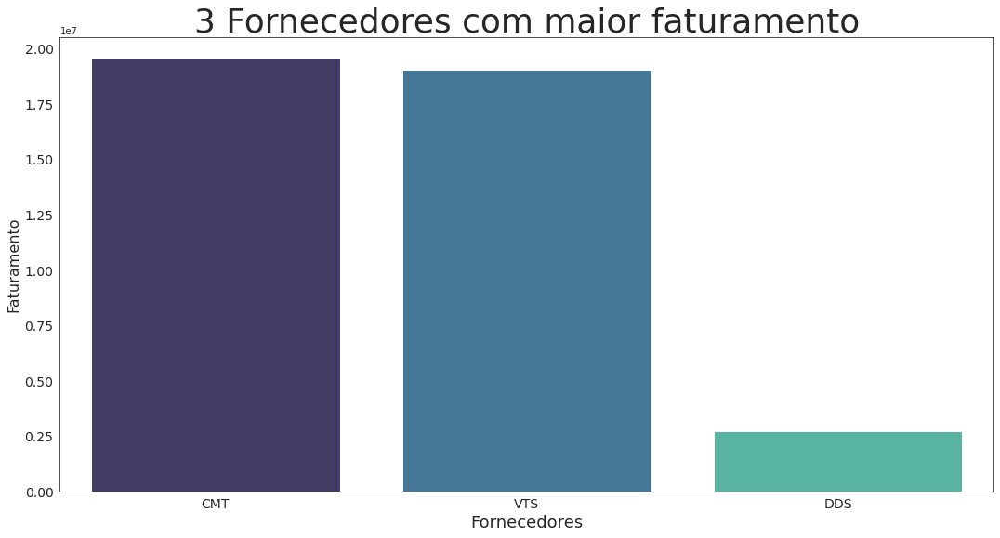

In [72]:
sns.barplot(x="vendor_id", y="total_amount", data=maiores_vendors.reset_index()[:3], palette = 'mako')
plt.title("3 Fornecedores com maior faturamento", fontsize=36)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('Fornecedores', fontsize=18)
plt.ylabel('Faturamento', fontsize=16)

In [26]:
# Fazendo merge do dataframe com a dimensão Pagamento
full_dataframe_payment = pd.merge(full_dataframe, df_payment_lookup, on='payment_type', how='inner')
full_dataframe_payment.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year,payment_lookup
0,CMT,2009-04-21T18:51:11.767205+00:00,2009-04-21T18:57:09.433767+00:00,2,0.80,-74.00,40.74,nan,nan,-73.99,40.75,Cash,5.40,0.00,0.00,0.00,5.40,2009-04-21,20090421,Tuesday,21,4,17,2,2009,Cash
1,CMT,2009-04-21T22:42:07.249485+00:00,2009-04-21T22:49:06.879952+00:00,2,1.40,-73.97,40.77,nan,nan,-73.98,40.78,Cash,7.10,0.00,0.00,0.00,7.10,2009-04-21,20090421,Tuesday,21,4,17,2,2009,Cash
2,CMT,2009-04-21T12:39:30.747149+00:00,2009-04-21T12:47:11.330268+00:00,1,3.40,-74.00,40.73,nan,nan,-73.97,40.76,Cash,10.90,0.00,0.00,0.00,10.90,2009-04-21,20090421,Tuesday,21,4,17,2,2009,Cash
3,CMT,2009-04-21T16:09:14.427034+00:00,2009-04-21T16:15:29.611933+00:00,1,2.10,-73.96,40.78,nan,nan,-73.98,40.76,Cash,9.30,0.00,0.00,0.00,9.30,2009-04-21,20090421,Tuesday,21,4,17,2,2009,Cash
4,CMT,2009-04-21T14:22:45.813124+00:00,2009-04-21T14:33:51.395183+00:00,4,0.70,-73.98,40.77,nan,nan,-73.99,40.76,Cash,4.90,0.00,0.00,0.00,4.90,2009-04-21,20090421,Tuesday,21,4,17,2,2009,Cash


In [27]:
# 3. Faça um histograma da distribuição mensal, nos 4 anos, de corridas pagas em dinheiro;
# Filtrando o dataframe para retornar apenas os registros de corridas pagas em Dinheiro
corridas_dinheiro = full_dataframe_payment[full_dataframe_payment['payment_lookup'] == 'Cash']
corridas_dinheiro.reset_index()
corridas_dinheiro.shape

(3242852, 26)

In [28]:
# corridas_dinheiro.sort_values(by=['year','month'], inplace=True)

In [29]:
# Agregando por ano e mês
corridas_dinheiro_hist = corridas_dinheiro.groupby(['year', 'month'])['payment_type'].agg('count').reset_index()

In [30]:
corridas_dinheiro_hist

,year,month,payment_type
0,2009,1,66824
1,2009,2,66680
2,2009,3,73948
3,2009,4,71142
4,2009,5,74151
5,2009,6,71342
6,2009,7,74076
7,2009,8,74021
8,2009,9,71511
9,2009,10,74011


In [31]:
corridas_dinheiro_hist['year_month'] = corridas_dinheiro_hist['year'].astype(str) + '-' + corridas_dinheiro_hist['month'].astype(str)

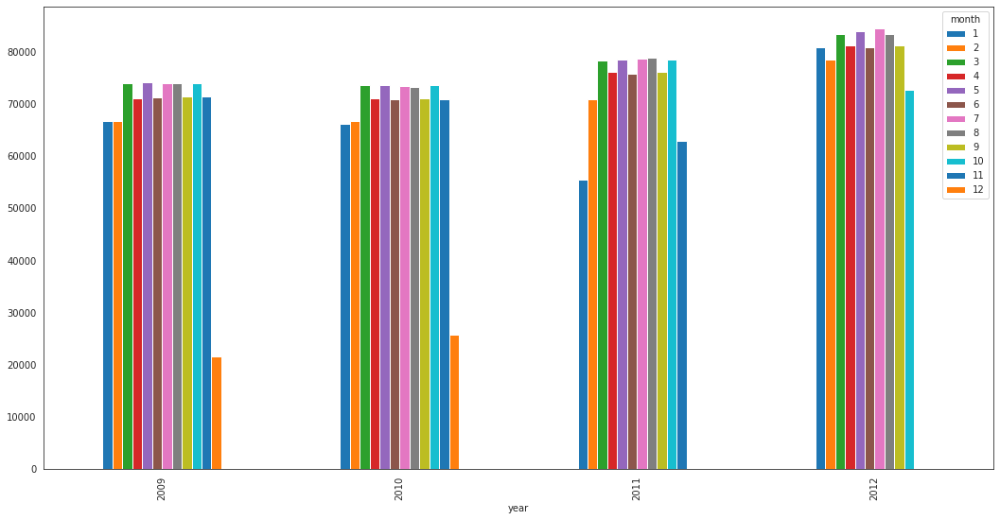

In [32]:
# Plotando gráfico com a resposta, vemos que 2011 não teve dados de dezembro, e 2012 não teve dados de novembro e dezembro.
corridas_dinheiro_hist.pivot('year','month','payment_type').plot.bar()

In [33]:
full_dataframe_payment.dtypes

vendor_id              object
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
trip_distance         float64
pickup_longitude      float64
pickup_latitude       float64
rate_code             float64
store_and_fwd_flag    float64
dropoff_longitude     float64
dropoff_latitude      float64
payment_type           object
fare_amount           float64
surcharge             float64
tip_amount            float64
tolls_amount          float64
total_amount          float64
date                   object
date_id                 int64
week_day               object
day                     int64
month                   int64
week                   UInt32
quarter                 int64
year                    int64
payment_lookup         object
dtype: object

In [34]:
# 4. Faça um gráfico de série temporal contando a quantidade de gorjetas de cada dia, nos últimos 3 meses de 2012.
# Altera tipo da coluna pickup_datetime para Datetime e poder filtrar
full_dataframe_payment['pickup_datetime'] = pd.to_datetime(full_dataframe_payment['pickup_datetime'])

In [35]:
mask = (full_dataframe_payment['pickup_datetime'] > '2012-10-01') & (full_dataframe_payment['pickup_datetime'] <= '2012-12-31')
gorjetas_3m_2012 = full_dataframe_payment.loc[mask]

In [36]:
gorjetas_3m_2012.tail(10)

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year,payment_lookup
3999887,CMT,2012-10-07 20:41:42.750510+00:00,2012-10-07T20:53:54.379067+00:00,1,0.00,0.00,0.00,nan,nan,0.00,0.00,Dispute,3.00,0.00,0.00,0.00,3.00,2012-10-07,20121007,Sunday,7,10,40,4,2012,Dispute
3999888,CMT,2012-10-07 22:51:02.285972+00:00,2012-10-07T23:00:34.894164+00:00,2,16.90,-73.97,40.75,nan,nan,-73.78,40.64,Dispute,45.00,0.00,0.00,0.00,45.00,2012-10-07,20121007,Sunday,7,10,40,4,2012,Dispute
3999896,CMT,2012-10-10 16:07:09.617411+00:00,2012-10-10T16:18:10.151476+00:00,1,2.80,-73.96,40.77,nan,nan,-73.94,40.75,Dispute,9.40,0.00,0.00,0.00,9.40,2012-10-10,20121010,Wednesday,10,10,41,4,2012,Dispute
3999904,CMT,2012-10-08 16:34:30.871675+00:00,2012-10-08T16:40:52.032854+00:00,1,0.00,-73.78,40.64,nan,nan,-73.78,40.64,Dispute,2.50,0.00,0.00,0.00,2.50,2012-10-08,20121008,Monday,8,10,41,4,2012,Dispute
3999905,CMT,2012-10-08 06:13:41.852231+00:00,2012-10-08T06:23:33.40704+00:00,1,4.50,-74.00,40.76,nan,nan,-73.94,40.79,Dispute,12.50,0.00,0.00,0.00,12.50,2012-10-08,20121008,Monday,8,10,41,4,2012,Dispute
3999906,CMT,2012-10-08 10:06:36.127671+00:00,2012-10-08T10:15:54.00597+00:00,1,0.00,-73.98,40.73,nan,nan,-73.98,40.73,Dispute,3.00,0.00,0.00,0.00,3.00,2012-10-08,20121008,Monday,8,10,41,4,2012,Dispute
3999946,CMT,2012-10-25 18:45:26.410800+00:00,2012-10-25T18:55:49.283931+00:00,1,1.50,-73.99,40.73,nan,nan,-73.99,40.72,Dispute,7.70,0.00,0.00,0.00,7.70,2012-10-25,20121025,Thursday,25,10,43,4,2012,Dispute
3999947,CMT,2012-10-25 16:58:53.120191+00:00,2012-10-25T17:06:18.771585+00:00,2,7.80,-73.87,40.77,nan,nan,-73.95,40.78,Dispute,18.60,0.00,0.00,0.00,18.60,2012-10-25,20121025,Thursday,25,10,43,4,2012,Dispute
3999958,CMT,2012-10-04 13:31:51.381412+00:00,2012-10-04T13:38:13.535278+00:00,1,2.80,-73.98,40.76,nan,nan,-74.00,40.73,Dispute,11.30,0.00,0.00,0.00,11.30,2012-10-04,20121004,Thursday,4,10,40,4,2012,Dispute
3999959,CMT,2012-10-04 22:55:19.586688+00:00,2012-10-04T23:06:21.616467+00:00,1,4.60,-73.99,40.72,nan,nan,-73.95,40.78,Dispute,13.80,0.00,0.00,0.00,13.80,2012-10-04,20121004,Thursday,4,10,40,4,2012,Dispute


In [37]:
gorjetas_time_series = gorjetas_3m_2012.groupby(gorjetas_3m_2012['pickup_datetime'].dt.date)['pickup_datetime'].agg('count')
gorjetas_time_series

pickup_datetime
2012-10-01    3273
2012-10-02    3324
2012-10-03    3387
2012-10-04    3367
2012-10-05    3312
2012-10-06    3289
2012-10-07    3286
2012-10-08    3220
2012-10-09    3360
2012-10-10    3403
2012-10-11    3237
2012-10-12    3330
2012-10-13    3365
2012-10-14    3261
2012-10-15    3467
2012-10-16    3259
2012-10-17    3381
2012-10-18    3322
2012-10-19    3340
2012-10-20    3301
2012-10-21    3283
2012-10-22    3296
2012-10-23    3372
2012-10-24    3401
2012-10-25    3245
2012-10-26    3371
2012-10-27    3297
Name: pickup_datetime, dtype: int64

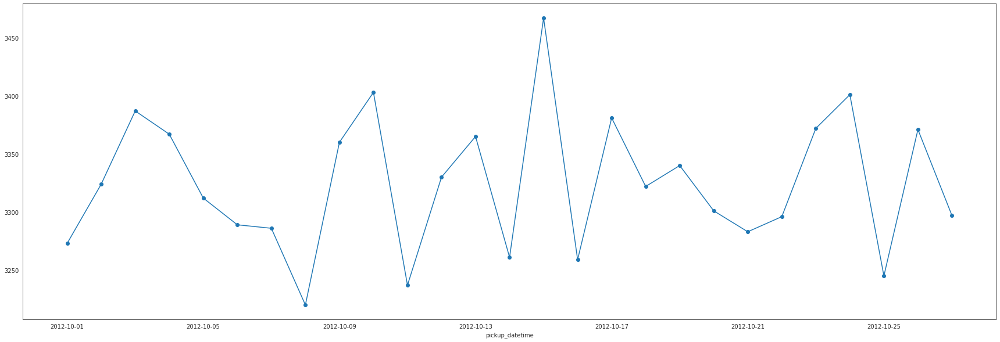

In [38]:
# Vemos que em 2012 só teve dados de corridas até novembro de 2012
gorjetas_time_series.plot(style="-o", figsize=(30, 10))

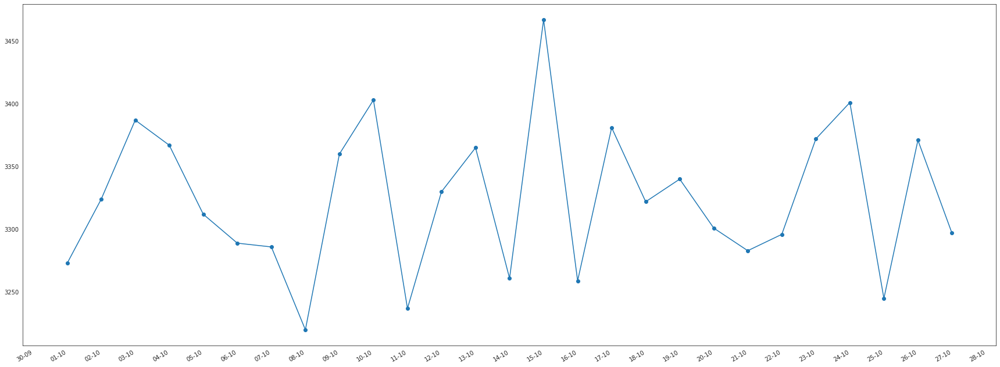

In [39]:
# Plotando os dados com outra formatação de data
import matplotlib.dates as mdates

plt.figure(figsize=(30,12))
plt.plot(gorjetas_time_series, marker='o', linestyle='-')
ax = plt.gca()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gcf().autofmt_xdate()
plt.show()

In [40]:
# Últimos dados são de outubro/2012
full_dataframe_sorted = full_dataframe_payment.sort_values(by=['year','month'])
full_dataframe_sorted.tail()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year,payment_lookup
3999906,CMT,2012-10-08 10:06:36.127671+00:00,2012-10-08T10:15:54.00597+00:00,1,0.00,-73.98,40.73,nan,nan,-73.98,40.73,Dispute,3.00,0.00,0.00,0.00,3.00,2012-10-08,20121008,Monday,8,10,41,4,2012,Dispute
3999946,CMT,2012-10-25 18:45:26.410800+00:00,2012-10-25T18:55:49.283931+00:00,1,1.50,-73.99,40.73,nan,nan,-73.99,40.72,Dispute,7.70,0.00,0.00,0.00,7.70,2012-10-25,20121025,Thursday,25,10,43,4,2012,Dispute
3999947,CMT,2012-10-25 16:58:53.120191+00:00,2012-10-25T17:06:18.771585+00:00,2,7.80,-73.87,40.77,nan,nan,-73.95,40.78,Dispute,18.60,0.00,0.00,0.00,18.60,2012-10-25,20121025,Thursday,25,10,43,4,2012,Dispute
3999958,CMT,2012-10-04 13:31:51.381412+00:00,2012-10-04T13:38:13.535278+00:00,1,2.80,-73.98,40.76,nan,nan,-74.00,40.73,Dispute,11.30,0.00,0.00,0.00,11.30,2012-10-04,20121004,Thursday,4,10,40,4,2012,Dispute
3999959,CMT,2012-10-04 22:55:19.586688+00:00,2012-10-04T23:06:21.616467+00:00,1,4.60,-73.99,40.72,nan,nan,-73.95,40.78,Dispute,13.80,0.00,0.00,0.00,13.80,2012-10-04,20121004,Thursday,4,10,40,4,2012,Dispute


In [41]:
# Qual o tempo médio das corridas nos dias de sábado e domingo;
weekend_data = full_dataframe_payment[full_dataframe_payment['week_day'].isin(['Saturday', 'Sunday'])]
weekend_data.shape

(1132674, 26)

In [42]:
weekend_data.dtypes

vendor_id                          object
pickup_datetime       datetime64[ns, UTC]
dropoff_datetime                   object
passenger_count                     int64
trip_distance                     float64
pickup_longitude                  float64
pickup_latitude                   float64
rate_code                         float64
store_and_fwd_flag                float64
dropoff_longitude                 float64
dropoff_latitude                  float64
payment_type                       object
fare_amount                       float64
surcharge                         float64
tip_amount                        float64
tolls_amount                      float64
total_amount                      float64
date                               object
date_id                             int64
week_day                           object
day                                 int64
month                               int64
week                               UInt32
quarter                           

In [ ]:
# Alterando o tipo do dado de dropoff_datetime para datetime, para conseguir extrair o tempo de duração das viagens
weekend_data['dropoff_datetime'] = pd.to_datetime(weekend_data['dropoff_datetime'])
#weekend_data['time_delta'] = pd.Timedelta(weekend_data['dropoff_datetime'] - weekend_data['pickup_datetime']).seconds / 60.0
weekend_data['total_minutes'] = (weekend_data['dropoff_datetime'] - weekend_data['pickup_datetime']) / pd.Timedelta(minutes=1)

In [50]:
weekend_data.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year,payment_lookup,total_minutes
10510,CMT,2009-06-27 23:54:48.442647+00:00,2009-06-28 00:01:16.068097+00:00,1,0.50,-73.98,40.74,nan,nan,-73.98,40.74,Cash,4.30,0.00,0.00,0.00,4.30,2009-06-27,20090627,Saturday,27,6,26,2,2009,Cash,6.46
10511,CMT,2009-06-27 15:43:58.925457+00:00,2009-06-27 15:49:43.628136+00:00,2,3.30,-74.01,40.71,nan,nan,-73.99,40.75,Cash,12.30,0.00,0.00,0.00,12.30,2009-06-27,20090627,Saturday,27,6,26,2,2009,Cash,5.75
10512,CMT,2009-06-27 21:40:34.131879+00:00,2009-06-27 21:47:35.506339+00:00,1,2.20,-73.99,40.75,nan,nan,-73.96,40.76,Cash,8.90,0.00,0.00,0.00,8.90,2009-06-27,20090627,Saturday,27,6,26,2,2009,Cash,7.02
10513,CMT,2009-06-27 16:48:25.876118+00:00,2009-06-27 16:58:43.979777+00:00,1,1.20,-73.98,40.76,nan,nan,-73.98,40.75,Cash,5.70,0.00,0.00,0.00,5.70,2009-06-27,20090627,Saturday,27,6,26,2,2009,Cash,10.30
10514,CMT,2009-06-27 13:16:20.725265+00:00,2009-06-27 13:27:29.717781+00:00,1,1.80,-73.95,40.79,nan,nan,-73.97,40.79,Cash,7.30,0.00,0.00,0.00,7.30,2009-06-27,20090627,Saturday,27,6,26,2,2009,Cash,11.15


In [44]:
media_corridas_weekend = weekend_data['total_minutes'].mean()
print(f'O tempo médio das corridas nos finais de semanas foi de {round(media_corridas_weekend,2)} minutos.')

O tempo médio das corridas nos finais de semanas foi de 8.75 minutos.


In [45]:
# Fazer uma visualização em mapa com latitude e longitude de pickups and dropoffs no ano de 2010;
corridas_2010 = full_dataframe.loc['2010']
corridas_2010.shape

(1000000, 25)

In [ ]:
!pip install geopandas
import pandas as pd
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame

In [47]:
corridas_2010.dtypes

vendor_id              object
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
trip_distance         float64
pickup_longitude      float64
pickup_latitude       float64
rate_code             float64
store_and_fwd_flag    float64
dropoff_longitude     float64
dropoff_latitude      float64
payment_type           object
fare_amount           float64
surcharge             float64
tip_amount            float64
tolls_amount          float64
total_amount          float64
date                   object
date_id                 int64
week_day               object
day                     int64
month                   int64
week                   UInt32
quarter                 int64
year                    int64
dtype: object

In [48]:
import folium
map_1 = folium.Map(location=[40.767937,-73.982155 ],tiles='OpenStreetMap', zoom_start=12)
for each in corridas_2010[:10000].iterrows():
    folium.CircleMarker([each[1]['pickup_latitude'],each[1]['pickup_longitude']],
                        radius=3,
                        color='blue',
                        popup=str(each[1]['pickup_latitude'])+','+str(each[1]['pickup_longitude']),
                        fill_color='#FD8A6C'
                        ).add_to(map_1)
map_1

Com os questionamentos respondidos, o próximo passo seria levar a solução para um ambiente de Cloud, de preferência AWS. Nesse ponto, temos várias formas de proceder, desde instanciar um EC2 para rodar nosso notebook, salvando os dataframes num Banco de dados Relacional (Amazon RDS ou Aurora), poderíamos usar o AWS Glue para fazer o ETL da nossa fonte de dados em conjunto com o Amazon Athena para analisar, usando o Glue Crawler para agendar os jobs, ou usar uma instância do Amazon SageMaker Notebook.
Devido ao tempo disponível para a conclusão do desafio, não foi possível mostrar alguma dessas alternativas para rodar a solução na AWS.

In [ ]:
# Convertendo a solução para HTML

%%shell
jupyter nbconvert --to html ///content/NYC_trips_challenge.ipynb